# Oregon Wildlife - Image Classification Capstone
## David Lappin
### BrainStation
#### 3/1/2023 -

# temp sources of info:

multilabel classification
https://www.analyticsvidhya.com/blog/2019/04/build-first-multi-label-image-classification-model-python/

# Introduction and Purpose

Fill in all the cool stuff for introduction later

# Table of Contents

Fill in all the cool stuff for the TOC later

# Packages Import

**Matplotlib** - Used as needed for basic visualizations

**Numpy** - Supports large, multi-dimensional arrays and matrices,and contains a large collection of high-level mathematical functions to operate on these arrays.

**PIL** - Python Imaging Library. Original support for python to deal with images

**OS** - interaction with the native OS Python (used for establishing relative path to data files)

**Tensorflow** - Machine learning and artificial intelligence with particular focus on training and inference of deep neural networks

**Keras** - Application Program interface (API) built on tensorflow. Used for implementing neural networks (supports backend computation in tensor flow up to 2.3)

                           

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL 
from glob import glob
import random
import shutil
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns


import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import sklearn.metrics as sk_metrics


# Data Import

Set relative path to data and explore some of the data within

In [2]:
#set local path to files for basic exploration

datapath = 'data/oregon_wildlife/' # This is the relative path to the data
image_files = os.listdir(datapath) #these are the individual folder names (the class names)

In [3]:
#shows the class names and the total number of classes in data set (20)
print(f'Total number of classes: {len(image_files)}\n\nClass Names: \n\n{image_files}')

Total number of classes: 20

Class Names: 

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'seals', 'sea_lions', 'virginia_opossum']


In [41]:
totalcount = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife/{file}/*')))
    totalcount.append(count)
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount)}')

747: bald_eagle
718: black_bear
696: bobcat
717: canada_lynx
735: columbian_black-tailed_deer
680: cougar
736: coyote
764: deer
660: elk
668: gray_fox
730: gray_wolf
577: mountain_beaver
701: nutria
728: raccoon
656: raven
759: red_fox
588: ringtail
698: seals
726: sea_lions
728: virginia_opossum
Total images: 14012


There are 14012 files in the sub folders. Now lets check what types of data they are.

In [42]:
#how many jpg files?

jpg_count = len(list(glob('data/oregon_wildlife/**/*.jpg')))
print(jpg_count)

13157


Note that the number of .jpg type files is not equal to the total image files. Checked what other types are in the images and created a list of those file types to check if they add up to the total file types (14012).

In [44]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count


Counts by file type: [58, 508, 4, 285, 13157]
Total of: 14012 files (this matches)
There are: 855 non ".jpg" files


# Look at some of the Images
Look at a few of the class folders and the images inside them

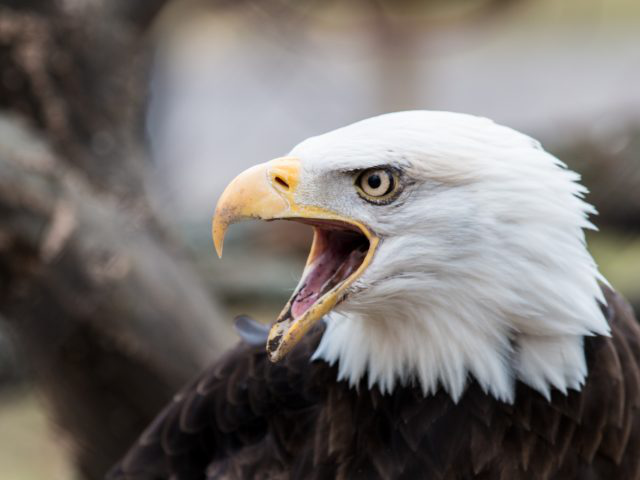

In [45]:
bald_eagle = list(glob(datapath+'bald_eagle/*'))
PIL.Image.open(str(bald_eagle[0]))

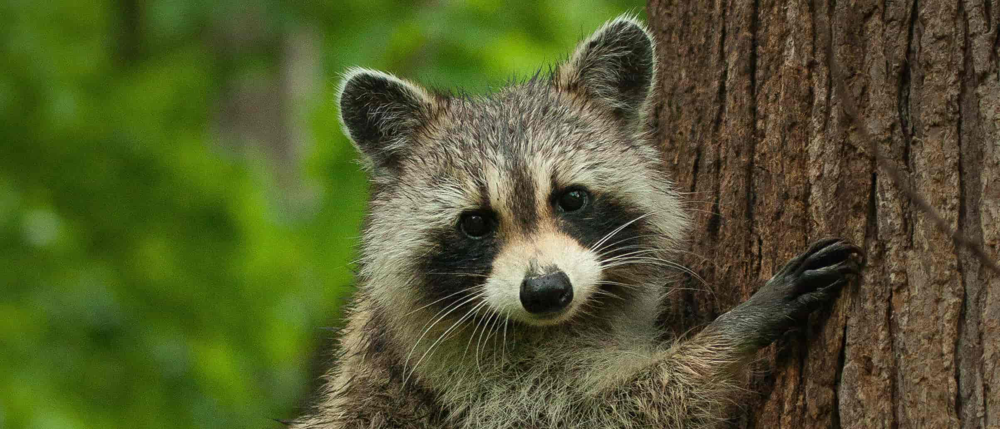

In [46]:
raccoon = list(glob(datapath+'raccoon/*'))
PIL.Image.open(str(raccoon[1]))

### Observations
Note that the photos below are not resized and they are not uniform in dimensions:
<a id='dimcompar'></a>

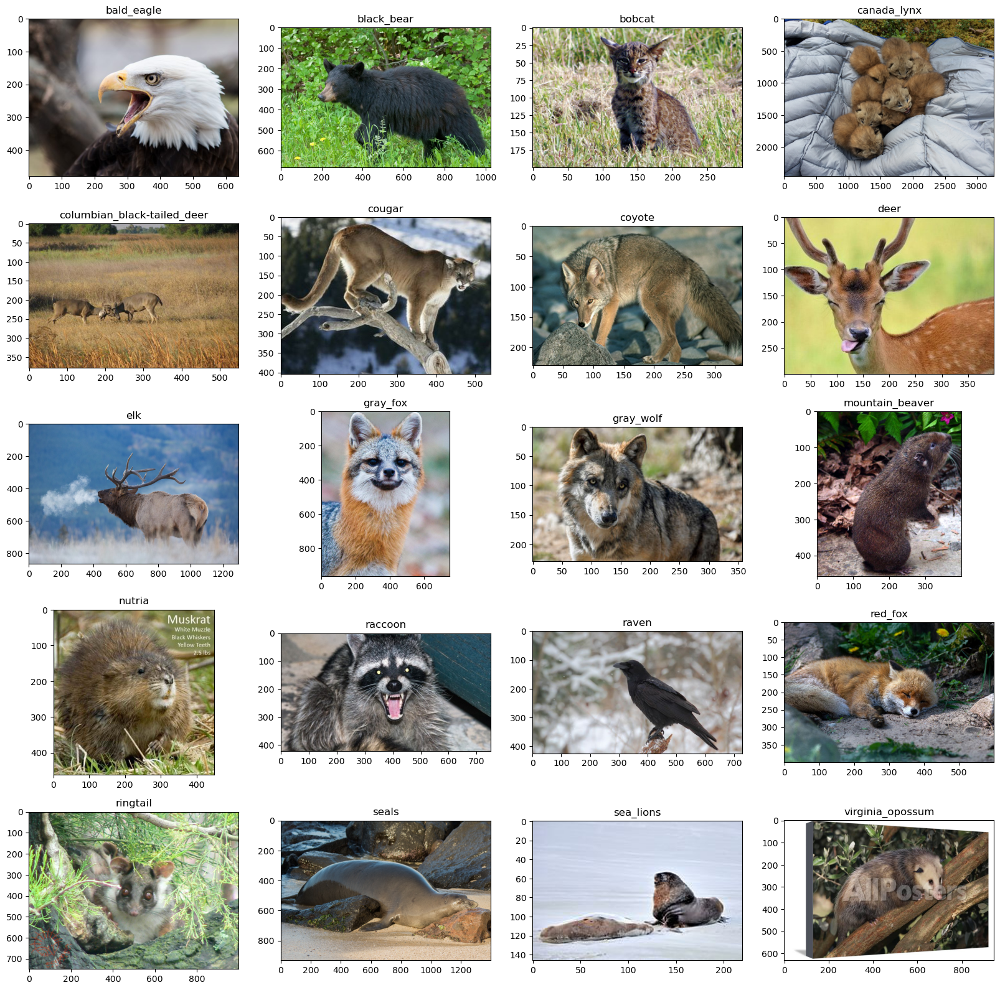

In [47]:
#shows one of each class of species in the main directory

speciesfigures=plt.figure(figsize =(20, 20))
n=0

for species in image_files:
    n+=1
    animals = list(glob(f'data/oregon_wildlife/{species}/*.*'))
    img = PIL.Image.open(str(animals[0]))
    speciesfigures.add_subplot(5, 4, n)
    plt.imshow(img)
    plt.title(species)
       

### Different File Extensions
Look at some different file extensions:

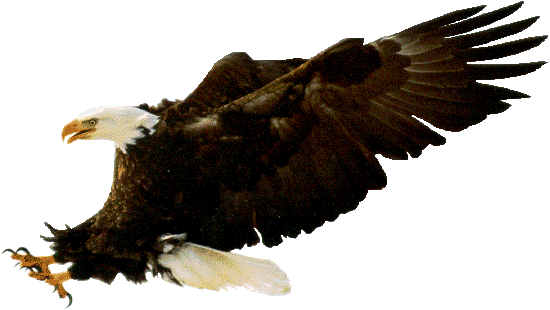

In [21]:
gifeagle = list(glob(datapath+'bald_eagle/*.gif'))
PIL.Image.open(str(gifeagle[0]))

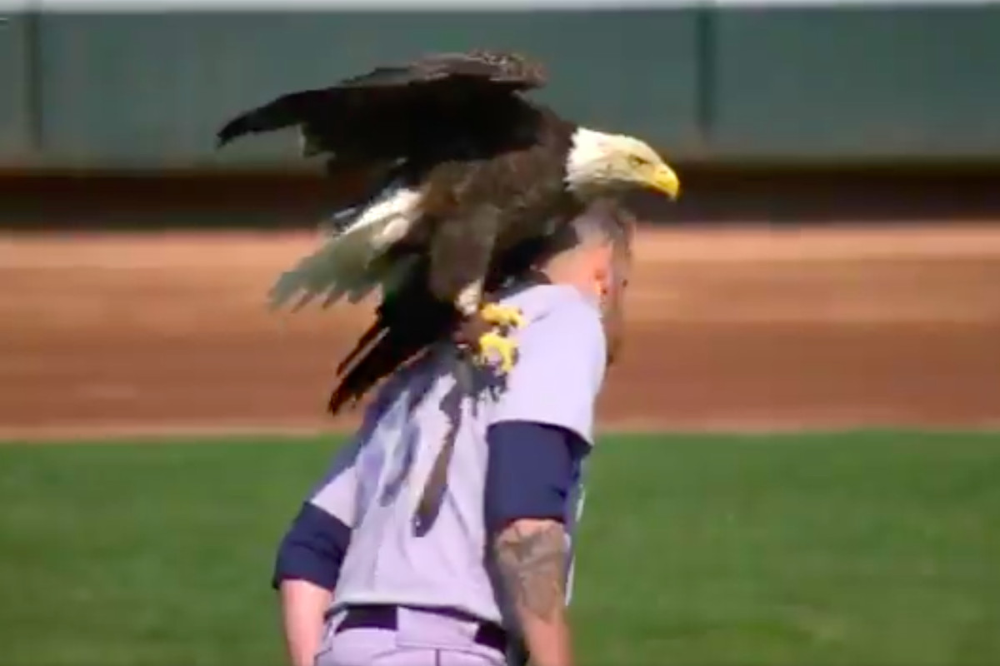

In [22]:
pngeagle = list(glob(datapath+'bald_eagle/*.png'))
PIL.Image.open(str(pngeagle[0]))

Look at all relevent extension types to make sure they open properly:

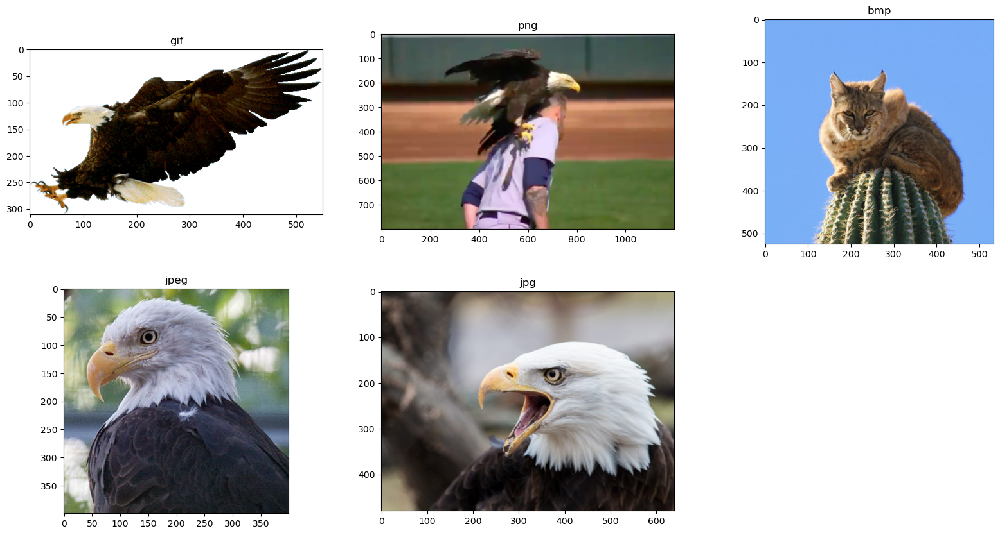

In [48]:
#check to see if all of the file extension types open correctly

filetypes = ('gif', 'png', 'bmp', 'jpeg', 'jpg') #determined what file types there where by looking a the directory properties

datatypefigures=plt.figure(figsize =(20, 10))
n=0
for i in filetypes:
    n+=1
    image = list(glob(f'data/oregon_wildlife/*/*.{i}'))
    plot_img = PIL.Image.open(str(image[0]))
    datatypefigures.add_subplot(2, 3, n)
    plt.imshow(plot_img)
    plt.title(i)

source may help for creating df from subfolders in main directory and resizing/scaling image imports
https://medium.com/mlearning-ai/image-classification-for-beginner-a6de7a69bc78

# Import and Split Dataframe

In [49]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [50]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 14012 files belonging to 20 classes.
Using 11210 files for training.


In [52]:
#confirm that all 20 classes are present in the training set

print(train_set.class_names)
print("")
print(f' There are still {len(train_set.class_names)} classes in the training data')

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'sea_lions', 'seals', 'virginia_opossum']

 There are still 20 classes in the training data


In [53]:
val_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 14012 files belonging to 20 classes.
Using 2802 files for validation.


In [55]:
#confirm that all 20 classes are present in the training set

print(val_set.class_names)
print("")
print(f' There are still {len(val_set.class_names)} classes in the testing data')

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'sea_lions', 'seals', 'virginia_opossum']

 There are still 20 classes in the testing data


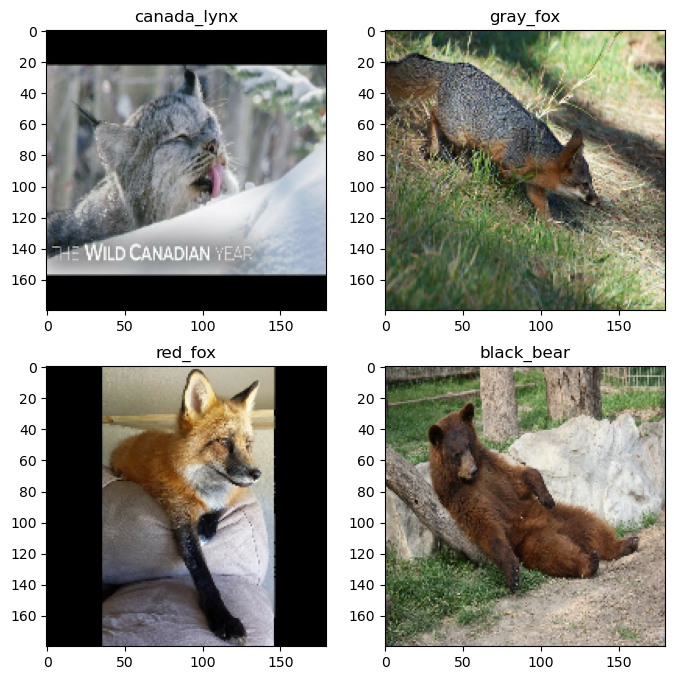

In [56]:
#plot the images to show that the sizes have been standardized in the new test/train sets

class_names = train_set.class_names

plt.figure(figsize=(8, 8))
for images, labels in train_set.take(1):
  for i in range(4):
    ax = plt.subplot(2, 2, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    #plt.axis("off")

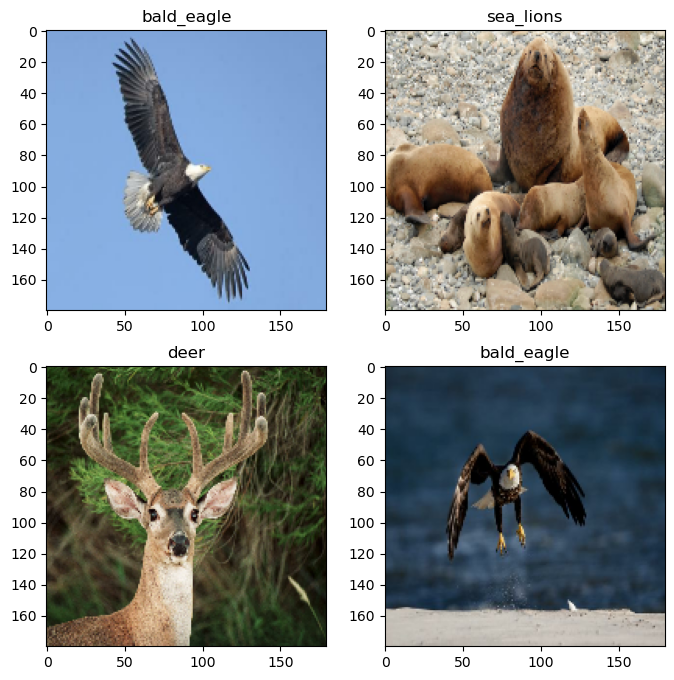

In [57]:
#plot the images to show that the sizes have been standardized in the new test/train sets

class_names = val_set.class_names

plt.figure(figsize=(8, 8))
for images, labels in test_set.take(1):
  for i in range(4):
    ax = plt.subplot(2, 2, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    #plt.axis("off")

### Observations:

The photos/information above indicate that the data was evenly split between the classes. All 20 classes are represented in both the training and the testing data sets. Additionally the images are resized to be uniform (180x180). This can be [compared to the initial](#dimcompar) exploration where the sizes of the photos were not uniform.

In [58]:
#shows the shape and dimensions in the training set images

for image_batch, labels_batch in train_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 180, 180, 3)
(32,)


In [59]:
#shows the shape and dimensions in the test set images

for image_batch, labels_batch in val_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 180, 180, 3)
(32,)


Each image in the training and test set is sized (180x180x3) with a batch size of 32 images per batch. The third dimension (3) corresponds to the RGB values in each image.

In [60]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
val_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


As noted above:
- **Autotune** allows for CPU performance optimizaiton
- **Cache** - stores imported images in memory for future epoch iterations
- **prefetch** - allows for overlapping of preprocess and training

In [61]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [62]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [63]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 45, 45, 64)       

In [64]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=val_set, 
  epochs=epochs            
)

Epoch 1/2


InvalidArgumentError: Graph execution error:

Input size should match (header_size + row_size * abs_height) but they differ by 2
	 [[{{node decode_image/DecodeImage}}]]
	 [[IteratorGetNext]] [Op:__inference_train_function_17174]

# Note:

There appears to be a sizing error. going to stepwise remove image extension types that are not .jpg. Will Start with .gif and see if the error persists.

In [73]:
#select and coutn all .gif files in the dir

rmgif = glob('data/oregon_wildlife/*/*.gif')
print(f'Example of file to be removed: {rmgif[1]}')
print(f'Total files to be removed = {len(rmgif)}')

Example of file to be removed: datanew/oregon_wildlife\bald_eagle\895e333ad4988ae8cf.gif
Total files to be removed = 58


### Warning - files to be removed from main directory in next kernel

In [75]:
#remove selected files
#THIS DELETES FILES FROM THE MAIN DIRECTORY

for i in rmgif:
    os.remove(i)

In [77]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count

Counts by file type: [0, 508, 4, 285, 13157]
Total of: 13954 files (this matches)
There are: 797 non ".jpg" files


Note that there are now no .gif file types in the directory (all 58 instances have been deleted)

RE-Run model with no .gif types:

In [78]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [79]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13954 files belonging to 20 classes.
Using 11164 files for training.


In [81]:
val_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13954 files belonging to 20 classes.
Using 2790 files for validation.


In [84]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
val_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


In [85]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [86]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [87]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 45, 45, 64)       

In [88]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=val_set, 
  epochs=epochs            
)

Epoch 1/2


InvalidArgumentError: Graph execution error:

Input size should match (header_size + row_size * abs_height) but they differ by 2
	 [[{{node decode_image/DecodeImage}}]]
	 [[IteratorGetNext]] [Op:__inference_train_function_18693]

# Note:

Removing .bmp files next

In [89]:
#select and coutn all .gif files in the dir

rmbmp = glob('data/oregon_wildlife/*/*.bmp')
print(f'Example of file to be removed: {rmbmp[1]}')
print(f'Total files to be removed = {len(rmbmp)}')

Example of file to be removed: datanew/oregon_wildlife\bobcat\5a6d6f8c9bb84082bd.bmp
Total files to be removed = 4


### Warning - files to be removed from main directory in next kernel

In [90]:
#remove selected files
#THIS DELETES FILES FROM THE MAIN DIRECTORY

for i in rmbmp:
    os.remove(i)

In [91]:
#determine how many of each file type there are in the directory

filetypes = ['gif', 'png', 'bmp', 'jpeg', 'jpg'] #determined what file types there where by looking a the directory properties
filetypescounts = [] #stores the counts

for ftype in filetypes:
    count = len(list(glob(f'data/oregon_wildlife/**/*.{ftype}')))
    filetypescounts.append(count)
    
print(f'Counts by file type: {filetypescounts}') #prints the total counts
print(f'Total of: {sum(filetypescounts)} files (this matches)') #prints the sum total of the counts
print(f'There are: {sum(filetypescounts) - len(jpg_count)} non ".jpg" files') # prints non jpg file type count

Counts by file type: [0, 508, 0, 285, 13157]
Total of: 13950 files (this matches)
There are: 793 non ".jpg" files


Note that there are now no .bmp file types in the directory (all 4 instances have been deleted)

RE-Run model with no .bmp types:

In [8]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [9]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 11160 files for training.


In [10]:
val_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13950 files belonging to 20 classes.
Using 2790 files for validation.


In [11]:
#creates a list of class names to be used later in the output layer of the model

class_names = train_set.class_names

In [12]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
val_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


As noted above:
- **Autotune** allows for CPU performance optimizaiton
- **Cache** - stores imported images in memory for future epoch iterations
- **prefetch** - allows for overlapping of preprocess and training

In [13]:
num_classes = len(class_names)
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [14]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [16]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=val_set, 
  epochs=epochs            
)

Epoch 1/2
349/349 [==============================] - 126s 288ms/step - loss: 2.5587 - accuracy: 0.2133 - val_loss: 2.1801 - val_accuracy: 0.3341
Epoch 2/2
349/349 [==============================] - 99s 283ms/step - loss: 1.6973 - accuracy: 0.5072 - val_loss: 1.5306 - val_accuracy: 0.5735


## Observations

It appears that the .bmp files were incompatible. Per Keras source, the files should not have posed an issue, but multiple trials with them removed has allowed the model to progress. It is also unclear if the .gif files were creating an issue, but since they constitued such a small percentage (~.4%) of the data, we will leave them out of the remaining analysis as well. 

Now that we know a basic model will work with out data set, we re-summarize our EDA efforts and begin to create a legitimate classification model.

# RE-Summarize Cleaned Data

Now that we have made some changes we can re-summarize the data we are working with and visualize the different classes before beginning to model.

Start be re-loading the data from the main directory to see all the changes:

In [18]:
#set local path to files

datapath = 'data/oregon_wildlife/' # This is the relative path to the data
image_files = os.listdir(datapath) #these are the individual folder names (the class names)

In [19]:
#shows the class names and the total number of classes in data set (20)

print(f'Total number of classes: {len(image_files)}\n\nClass Names: \n\n{image_files}')

Total number of classes: 20

Class Names: 

['bald_eagle', 'black_bear', 'bobcat', 'canada_lynx', 'columbian_black-tailed_deer', 'cougar', 'coyote', 'deer', 'elk', 'gray_fox', 'gray_wolf', 'mountain_beaver', 'nutria', 'raccoon', 'raven', 'red_fox', 'ringtail', 'seals', 'sea_lions', 'virginia_opossum']


In [6]:
totalcount = []
class_for_count = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife/{file}/*')))
    totalcount.append(count)
    class_for_count.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount)}')

723: bald_eagle
695: black_bear
670: bobcat
693: canada_lynx
715: columbian_black-tailed_deer
653: cougar
716: coyote
743: deer
640: elk
648: gray_fox
710: gray_wolf
555: mountain_beaver
671: nutria
704: raccoon
630: raven
737: red_fox
561: ringtail
675: seals
705: sea_lions
706: virginia_opossum
Total images: 13550


Notice now that the total images in the data set are less than when we originally began working with the data. Even though we re-loaded the data set, we have removed the unwanted files from the directory itself. Now, anytime we call to the data directory we will be accessing clean and workable data. 

In [7]:
#creates simple dataframe for the class counts in the dataset

classcounts = pd.DataFrame(list(zip(class_for_count, totalcount)), #zip the two lists together from above
                 columns=['class_id','count']) #Assign column names
classcounts

,class_id,count
0,bald_eagle,723
1,black_bear,695
2,bobcat,670
3,canada_lynx,693
4,columbian_black-tailed_deer,715
5,cougar,653
6,coyote,716
7,deer,743
8,elk,640
9,gray_fox,648


In [8]:
#add percent total to df

classcounts['pct_total'] = round(classcounts['count']/(classcounts['count'].sum())*100, 2)
 
classcounts

,class_id,count,pct_total
0,bald_eagle,723,5.34
1,black_bear,695,5.13
2,bobcat,670,4.94
3,canada_lynx,693,5.11
4,columbian_black-tailed_deer,715,5.28
5,cougar,653,4.82
6,coyote,716,5.28
7,deer,743,5.48
8,elk,640,4.72
9,gray_fox,648,4.78


In [52]:
#what is the average percentage across all classes

mean_pct_avg = classcounts['pct_total'].mean()
round(mean_pct_avg, 2)

5.0

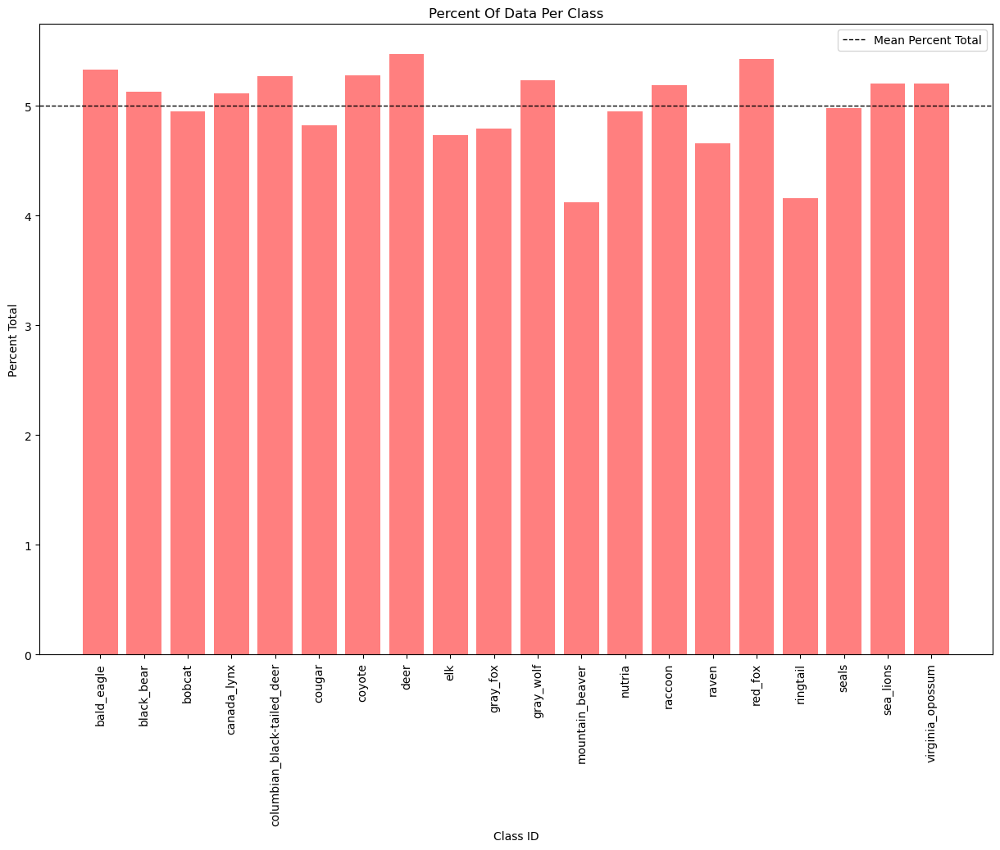

In [53]:
#plot the percent total for each class in the data

plt.figure(figsize = (15, 10))

plt.bar(classcounts['class_id'], classcounts['pct_total'], color = 'red', alpha = 0.5)
plt.title('percent of data per class'.title())
plt.xlabel('Class ID')
plt.ylabel('Percent Total')

plt.axhline(mean_pct_avg, color = 'black', linestyle = '--', linewidth = 1, label = 'Mean Percent Total')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

### Observations

Looking at the cleaned data we see that the data still contains all 20 classes. These classes are relatively balanced with a mean percent total of 1/20 (5%). From the visual above we can see that the majority of classes fall close to the mean. The `gray wolf` and `red fox` classes account for the lowest percentages, but still are within 1% of the mean. Generally, this data set is fairly balanced which will be helpful for modelling going forward. 

# Create Test Split

Now that the data is cleaned and compatible with the modelling, we will create a test set to evaluate and predict on our models later. To do this we will create a new test directory `oregon_wildlife_test` and we will replicate the subfolders. We will then randomly sample 20 files from each subfolder class and move them to the new test directory for use later.

In [12]:
#check the path for the current directory

os.getcwd()

'C:\\Users\\dlapp\\Documents\\Data Science Files\\BrainStation_Bootcamp\\Capstone Project\\working'

In [14]:
#create variable for current directory path

current_dir = os.getcwd()
current_dir

'C:\\Users\\dlapp\\Documents\\Data Science Files\\BrainStation_Bootcamp\\Capstone Project\\working'

In [15]:
#make new test directory folder 

#os.mkdir(current_dir+'\\data\\oregon_wildlife_test') 

In [27]:
#create list of subfolder names using previously defined dataframe

#class_list = list(classcounts['class_id'])

In [30]:
#replicate subfolders into the new test directory

#for i in class_list:
    #os.mkdir(current_dir+'\\data\\oregon_wildlife_test\\'+i) 

In [38]:
#test to see if files are sampled correctly

source = (current_dir+'\\data\\oregon_wildlife\\'+i)
dest = (current_dir+'\\data\\oregon_wildlife_test\\'+i)
files = os.listdir(source)
random.sample(files, 5)

['8c009531b1d0550c10.jpg',
 '4cfaa3f8d170b9bcfc.JPG',
 '4f69b980ac6a16fb19.jpg',
 '66e79c84deb5dfae1c.jpg',
 '489084a00bfa38468c.jpg']

In [50]:
#select 20 random files from each subfolder in the main directory and move them to their respective subfolders in
    #the new test directory
    
#only need to run this code once so it is hidden

#for i in class_list:
    #source = (current_dir+'\\data\\oregon_wildlife\\'+i)
    #dest = (current_dir+'\\data\\oregon_wildlife_test\\'+i)
    #files = os.listdir(source)
    #samp = random.sample(files, 20)
    #for x in samp:
        #shutil.move(os.path.join(source, x), dest)
    

Now that the files are moved we can confirm that they moved correctly, and are the correct classes:

In [3]:
#confirm that the files in the test folders moved 

totalcount = []
class_for_count = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife_test/{file}/*')))
    totalcount.append(count)
    class_for_count.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images in test directory: {sum(totalcount)}')

20: bald_eagle
20: black_bear
20: bobcat
20: canada_lynx
20: columbian_black-tailed_deer
20: cougar
20: coyote
20: deer
20: elk
20: gray_fox
20: gray_wolf
20: mountain_beaver
20: nutria
20: raccoon
20: raven
20: red_fox
20: ringtail
20: seals
20: sea_lions
20: virginia_opossum
Total images in test directory: 400


It appears that 20 photos are now in each of the subfolders for the test directory. We can also check to make sure that the classes are correct by looking at photos from each of the new subfolders.

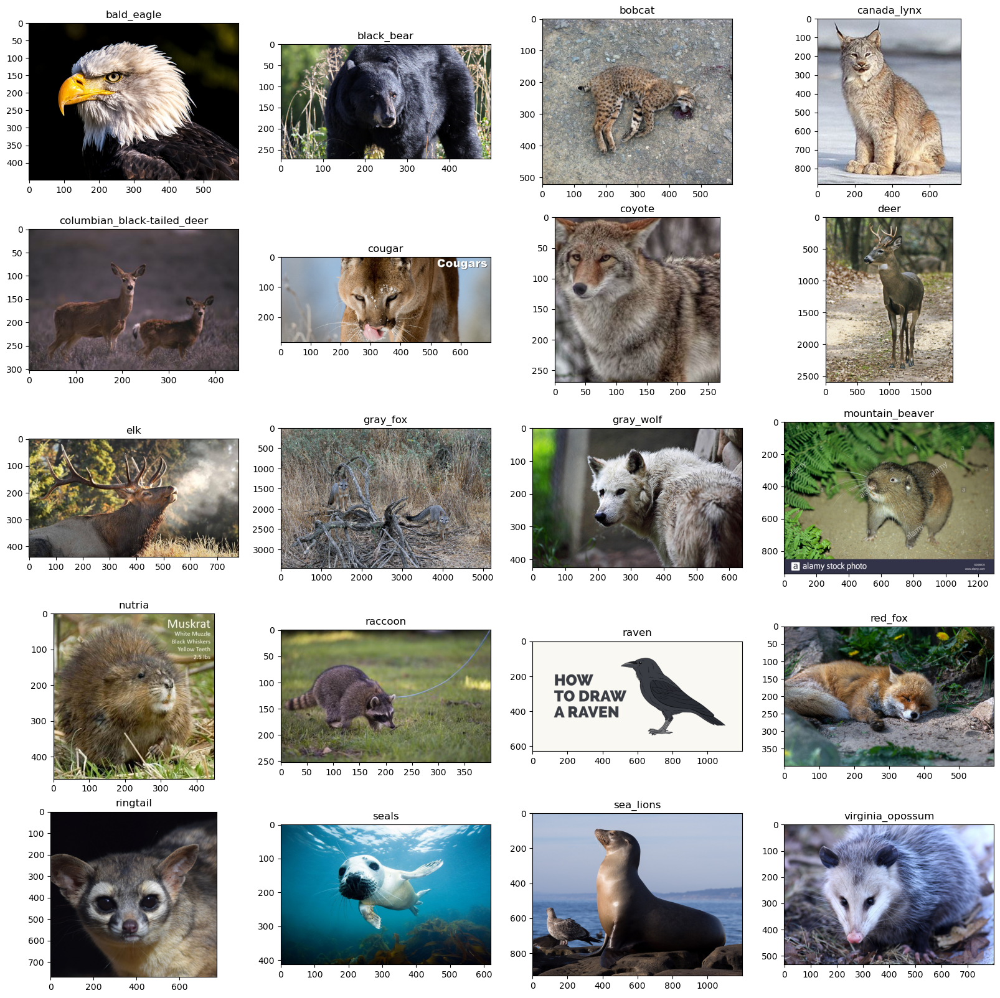

In [55]:
#shows one of each class of species in the test directory

speciesfigures=plt.figure(figsize =(20, 20))
n=0

for species in image_files:
    n+=1
    animals = list(glob(f'data/oregon_wildlife_test/{species}/*.*'))
    img = PIL.Image.open(str(animals[0]))
    speciesfigures.add_subplot(5, 4, n)
    plt.imshow(img)
    plt.title(species)

# Create Validation Split

In order to fully seperate the data to minimize the potential for data leakeage we are also going to create a new directory for the validation data. We will use the same process we did for the test set above.

In [3]:
#check the path for the current directory

os.getcwd()

'C:\\Users\\dlapp\\Documents\\Data Science Files\\BrainStation_Bootcamp\\Capstone Project\\working'

In [4]:
#create variable for current directory path

current_dir = os.getcwd()
current_dir

'C:\\Users\\dlapp\\Documents\\Data Science Files\\BrainStation_Bootcamp\\Capstone Project\\working'

In [5]:
#make new validation directory folder 

os.mkdir(current_dir+'\\data\\oregon_wildlife_validation') 

In [9]:
#create list of subfolder names using previously defined dataframe

class_list = list(classcounts['class_id'])

In [11]:
#replicate subfolders into the new validation directory

for i in class_list:
    os.mkdir(current_dir+'\\data\\oregon_wildlife_validation\\'+i) 

In [12]:
#test to see if files are sampled correctly

source = (current_dir+'\\data\\oregon_wildlife\\'+i)
dest = (current_dir+'\\data\\oregon_wildlife_validation\\'+i)
files = os.listdir(source)
random.sample(files, 5)

['492362af40d93a5f90.png',
 'fc241e6db87a01e2f3.jpg',
 '29c3720ff8d39537d2.JPG',
 '832f174b08e5080d9d.jpg',
 'af71f1bee401c1f417.jpg']

We are going to take enough photos from each class to represent roughly 20% of the data. In order to do this we will determine how many photos need to be taken from each class and then take the average of all classes. This average will be the amount of phots taken from each class to roughly represent 20% of the data. 

**Note:** This will not maintain perfect stratification in the split but we will check for potential imbalances after.

In [20]:
(classcounts['count']*0.2)

0     144.6
1     139.0
2     134.0
3     138.6
4     143.0
5     130.6
6     143.2
7     148.6
8     128.0
9     129.6
10    142.0
11    111.0
12    134.2
13    140.8
14    126.0
15    147.4
16    112.2
17    135.0
18    141.0
19    141.2
Name: count, dtype: float64

In [19]:
#determine the average number of photos for all classes that account for 20% of class

round((classcounts['count']*0.2).mean(),0)

135.0

In [21]:
#select 20 random files from each subfolder in the main directory and move them to their respective subfolders in
    #the new validation directory
    
#only need to run this code once so it is hidden

for i in class_list:
    source = (current_dir+'\\data\\oregon_wildlife\\'+i)
    dest = (current_dir+'\\data\\oregon_wildlife_validation\\'+i)
    files = os.listdir(source)
    samp = random.sample(files, 135)
    for x in samp:
        shutil.move(os.path.join(source, x), dest)
    

Now that the files are moved we can confirm that they moved correctly, and are the correct classes:

In [22]:
#confirm that the files in the test folders moved 

totalcount = []
class_for_count = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife_validation/{file}/*')))
    totalcount.append(count)
    class_for_count.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images in test directory: {sum(totalcount)}')

135: bald_eagle
135: black_bear
135: bobcat
135: canada_lynx
135: columbian_black-tailed_deer
135: cougar
135: coyote
135: deer
135: elk
135: gray_fox
135: gray_wolf
135: mountain_beaver
135: nutria
135: raccoon
135: raven
135: red_fox
135: ringtail
135: seals
135: sea_lions
135: virginia_opossum
Total images in test directory: 2700


It appears that 20 photos are now in each of the subfolders for the test directory. We can also check to make sure that the classes are correct by looking at photos from each of the new subfolders.

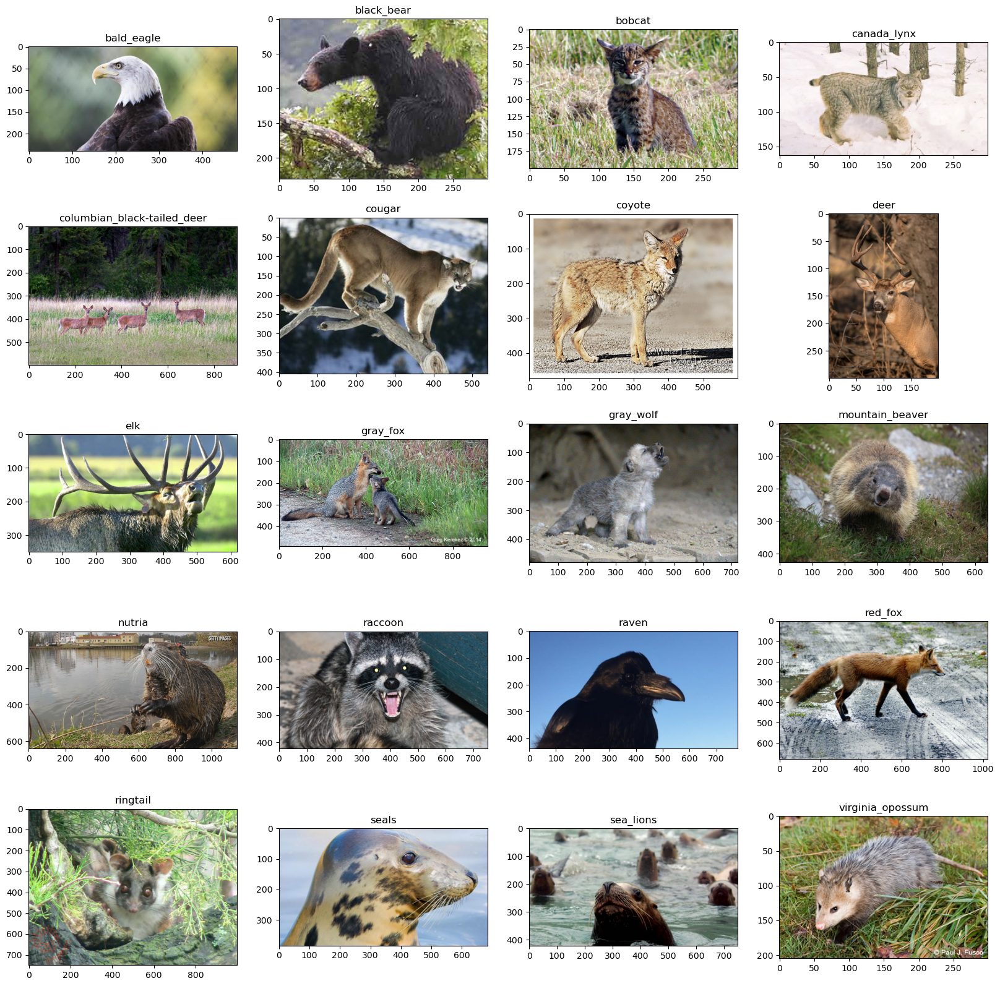

In [23]:
#shows one of each class of species in the validation directory

speciesfigures=plt.figure(figsize =(20, 20))
n=0

for species in image_files:
    n+=1
    animals = list(glob(f'data/oregon_wildlife_validation/{species}/*.*'))
    img = PIL.Image.open(str(animals[0]))
    speciesfigures.add_subplot(5, 4, n)
    plt.imshow(img)
    plt.title(species)

## Re-Create classcounts dataframe and summarize

We can look at how this split changed the counts in the training split and visualize to determine if the data remains balanced.

In [31]:
#create counts of each class for the training set
totalcount_train = []
class_for_count = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife/{file}/*')))
    totalcount_train.append(count)
    class_for_count.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount_train)}')

588: bald_eagle
560: black_bear
535: bobcat
558: canada_lynx
580: columbian_black-tailed_deer
518: cougar
581: coyote
608: deer
505: elk
513: gray_fox
575: gray_wolf
420: mountain_beaver
536: nutria
569: raccoon
495: raven
602: red_fox
426: ringtail
540: seals
570: sea_lions
571: virginia_opossum
Total images: 10850


In [24]:
#create counts of each class for the validation set

totalcount_val = []
class_for_count_val = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife_validation/{file}/*')))
    totalcount_val.append(count)
    class_for_count_val.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount_val)}')

135: bald_eagle
135: black_bear
135: bobcat
135: canada_lynx
135: columbian_black-tailed_deer
135: cougar
135: coyote
135: deer
135: elk
135: gray_fox
135: gray_wolf
135: mountain_beaver
135: nutria
135: raccoon
135: raven
135: red_fox
135: ringtail
135: seals
135: sea_lions
135: virginia_opossum
Total images: 2700


In [46]:
#create counts of each class for the test set

totalcount_test = []
class_for_count_test = []

for file in image_files:
    
    count = len(list(glob(f'data/oregon_wildlife_test/{file}/*')))
    totalcount_test.append(count)
    class_for_count_test.append(file)
    
    print(f'{count}: {file}')
    
print(f'Total images: {sum(totalcount_test)}')

20: bald_eagle
20: black_bear
20: bobcat
20: canada_lynx
20: columbian_black-tailed_deer
20: cougar
20: coyote
20: deer
20: elk
20: gray_fox
20: gray_wolf
20: mountain_beaver
20: nutria
20: raccoon
20: raven
20: red_fox
20: ringtail
20: seals
20: sea_lions
20: virginia_opossum
Total images: 400


In [48]:
#creates simple dataframe for the class counts in the dataset

classcounts = pd.DataFrame(list(zip(class_for_count, totalcount_train, totalcount_val, totalcount_test)), #zip the lists together from above
                 columns=['class_id','count_train', 'count_val', 'count_test']) #Assign column names
classcounts

,class_id,count_train,count_val,count_test
0,bald_eagle,588,135,20
1,black_bear,560,135,20
2,bobcat,535,135,20
3,canada_lynx,558,135,20
4,columbian_black-tailed_deer,580,135,20
5,cougar,518,135,20
6,coyote,581,135,20
7,deer,608,135,20
8,elk,505,135,20
9,gray_fox,513,135,20


In [49]:
#add percent total to df

classcounts['pct_total_train'] = round(classcounts['count_train']/(classcounts['count_train'].sum())*100, 2)
 
classcounts.head()

,class_id,count_train,count_val,count_test,pct_total_train
0,bald_eagle,588,135,20,5.42
1,black_bear,560,135,20,5.16
2,bobcat,535,135,20,4.93
3,canada_lynx,558,135,20,5.14
4,columbian_black-tailed_deer,580,135,20,5.35


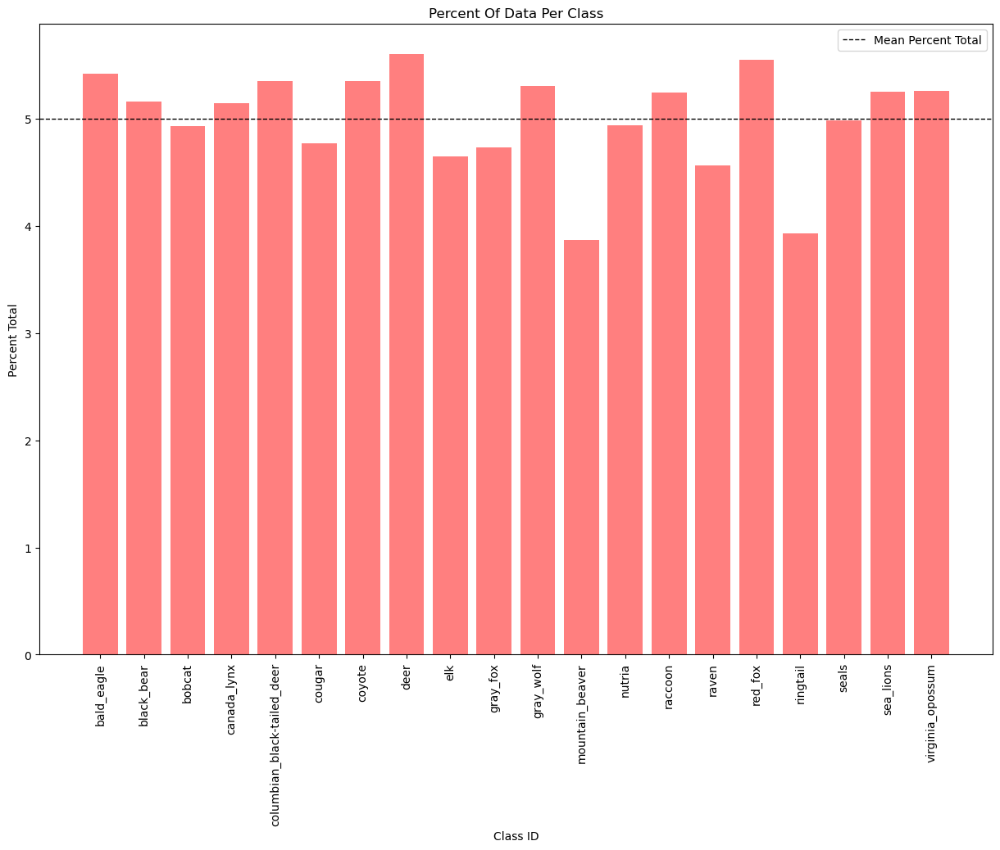

In [50]:
#plot the percent total for each class in the data

plt.figure(figsize = (15, 10))

plt.bar(classcounts['class_id'], classcounts['pct_total_train'], color = 'red', alpha = 0.5)
plt.title('percent of data per class'.title())
plt.xlabel('Class ID')
plt.ylabel('Percent Total')

plt.axhline(5, color = 'black', linestyle = '--', linewidth = 1, label = 'Mean Percent Total')
plt.xticks(rotation = 90)
plt.legend()
plt.show()

#### Observation
As expected the variation across classes varies slightly more by sampling in this method, however there are no major data imbalances and so we will move foward with these data splits into modelling.

# Re-compile and Re-Run Baseline Model 

Now that the formatting issues are sorted out we will recompile and re-run a baseline model with more 

In [128]:
#define loading parameters 

batch_size = 32 
img_height = 180
img_width = 180

In [129]:
train_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="training",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13550 files belonging to 20 classes.
Using 10840 files for training.


In [110]:
val_set = tf.keras.preprocessing.image_dataset_from_directory(
  datapath,
  validation_split=0.2,
  subset="validation",
  label_mode='int',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 13550 files belonging to 20 classes.
Using 2710 files for validation.


In [111]:
#adjust the prefetching for performance

AUTOTUNE = tf.data.AUTOTUNE #Autotune optimizes CPU uptime for each batch

train_set = train_set.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #cache stores data in memory after 1st epoch for faster iterations
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE) #prefetch allows for overlapping 


In [112]:
num_classes = 20
img_height = 180
img_width = 180

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])


In [113]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [93]:
import visualkeras

visualkeras.layered_view(model,legend=True, draw_volume=True) #, to_file='xxxxxx.png' save feature if desired 

ModuleNotFoundError: No module named 'visualkeras'

In [114]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 90, 90, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 45, 45, 64)       

In [101]:
epochs = 2

history = model.fit(   
  train_set,            
  validation_data=val_set, 
  epochs=epochs            
)

Epoch 1/2
339/339 [==============================] - 126s 300ms/step - loss: 2.5643 - accuracy: 0.2113 - val_loss: 2.1484 - val_accuracy: 0.3572
Epoch 2/2
339/339 [==============================] - 100s 294ms/step - loss: 1.6918 - accuracy: 0.5065 - val_loss: 1.5944 - val_accuracy: 0.5561


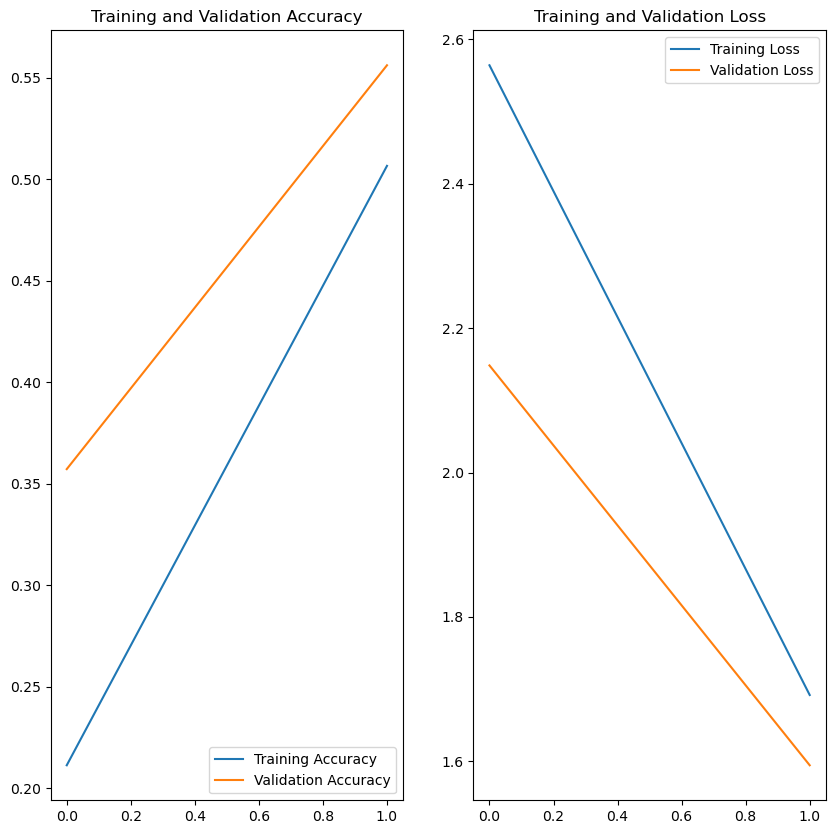

In [165]:
#visualize model performance

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [166]:
test_set = tf.keras.preprocessing.image_dataset_from_directory(
  ('data\\oregon_wildlife_test\\'),
  image_size=(img_height, img_width),
  label_mode = 'categorical')

Found 400 files belonging to 20 classes.


In [167]:
predictions = np.array([])
labels =  np.array([])
for x, y in test_set:
  predictions = np.concatenate([predictions, np.argmax(model.predict(x), axis = -1)])
  labels = np.concatenate([labels, np.argmax(y.numpy(), axis=-1)])

1/1 [==============================] - 0s 38ms/step


In [168]:
con_mat = tf.math.confusion_matrix(labels=labels, predictions=predictions).numpy()

In [169]:
normalized_conf_mat = con_mat / con_mat.sum(axis=1)

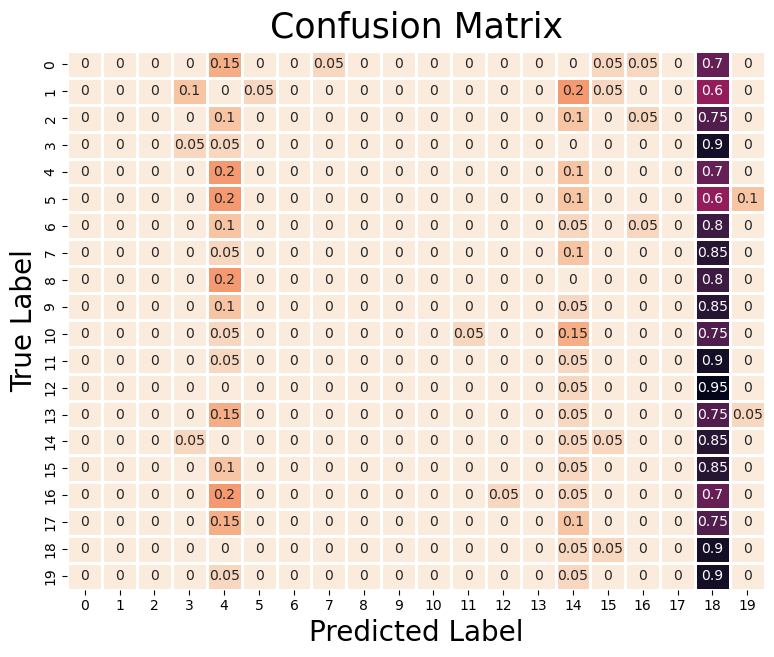

In [170]:
plt.figure(figsize = (9,7))
sns.heatmap(normalized_conf_mat,
            annot=True,
            cbar=False,
            cmap="rocket_r",
            linewidths=1
           )
plt.title('Confusion Matrix',size = 25,y=1.01)
plt.xlabel("Predicted Label", size = 20)
plt.ylabel("True Label", size = 20)
plt.show()

In [171]:
target_names = test_set.class_names
print(classification_report(labels, predictions, target_names = target_names))

                             precision    recall  f1-score   support

                 bald_eagle       0.00      0.00      0.00        20
                 black_bear       0.00      0.00      0.00        20
                     bobcat       0.00      0.00      0.00        20
                canada_lynx       0.25      0.05      0.08        20
columbian_black-tailed_deer       0.11      0.20      0.14        20
                     cougar       0.00      0.00      0.00        20
                     coyote       0.00      0.00      0.00        20
                       deer       0.00      0.00      0.00        20
                        elk       0.00      0.00      0.00        20
                   gray_fox       0.00      0.00      0.00        20
                  gray_wolf       0.00      0.00      0.00        20
            mountain_beaver       0.00      0.00      0.00        20
                     nutria       0.00      0.00      0.00        20
                    raccoon      

C:\Users\dlapp\anaconda3\envs\baseclone\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dlapp\anaconda3\envs\baseclone\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dlapp\anaconda3\envs\baseclone\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Observations

Baseline model performs with a 99% training accuracy and an 81% testing accuracy after 10 epochs. The model is overfit. 

# Assess Overfitting

Will take steps to reduce overfittign through the addition of data augmentation and drop out layers.

**Data Augmentation** - Transforms existing image data. Allows the model to process more variation and generalize better in the testing phase.

**Dropout** - Randomly reduces the contribution of some neurons in a layer. Helps to regularize the data and reduce overfitting.

In [140]:
# creates an augmentation sequence that can be used on a single example to create new variations

data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [143]:
#Recreate the model with drop out and augmentation (augmentation parameter defined above)

model = Sequential([
  data_augmentation, # added in augmentaion here
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2), #included drop out layer here (20%)
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  #drop out layer should be here
  layers.Dense(num_classes, name="outputs")
])

In [144]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [145]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [146]:
epochs = 10

history = model.fit(   
  train_set,            
  validation_data=test_set, 
  epochs=epochs            
)

Epoch 1/10
349/349 [==============================] - 112s 313ms/step - loss: 2.6135 - accuracy: 0.1996 - val_loss: 2.4675 - val_accuracy: 0.2566
Epoch 2/10
349/349 [==============================] - 108s 309ms/step - loss: 2.2866 - accuracy: 0.3010 - val_loss: 2.1944 - val_accuracy: 0.3305
Epoch 3/10
349/349 [==============================] - 109s 311ms/step - loss: 2.0813 - accuracy: 0.3667 - val_loss: 2.3308 - val_accuracy: 0.3391
Epoch 4/10
349/349 [==============================] - 110s 315ms/step - loss: 1.8998 - accuracy: 0.4229 - val_loss: 1.9187 - val_accuracy: 0.4272
Epoch 5/10
349/349 [==============================] - 109s 313ms/step - loss: 1.7309 - accuracy: 0.4724 - val_loss: 1.8485 - val_accuracy: 0.4513
Epoch 6/10
349/349 [==============================] - 109s 312ms/step - loss: 1.6014 - accuracy: 0.5142 - val_loss: 1.8968 - val_accuracy: 0.4559
Epoch 7/10
349/349 [==============================] - 108s 310ms/step - loss: 1.4796 - accuracy: 0.5494 - val_loss: 1.7293 -

Text(0.5, 1.0, 'Training and Validation Accuracy')

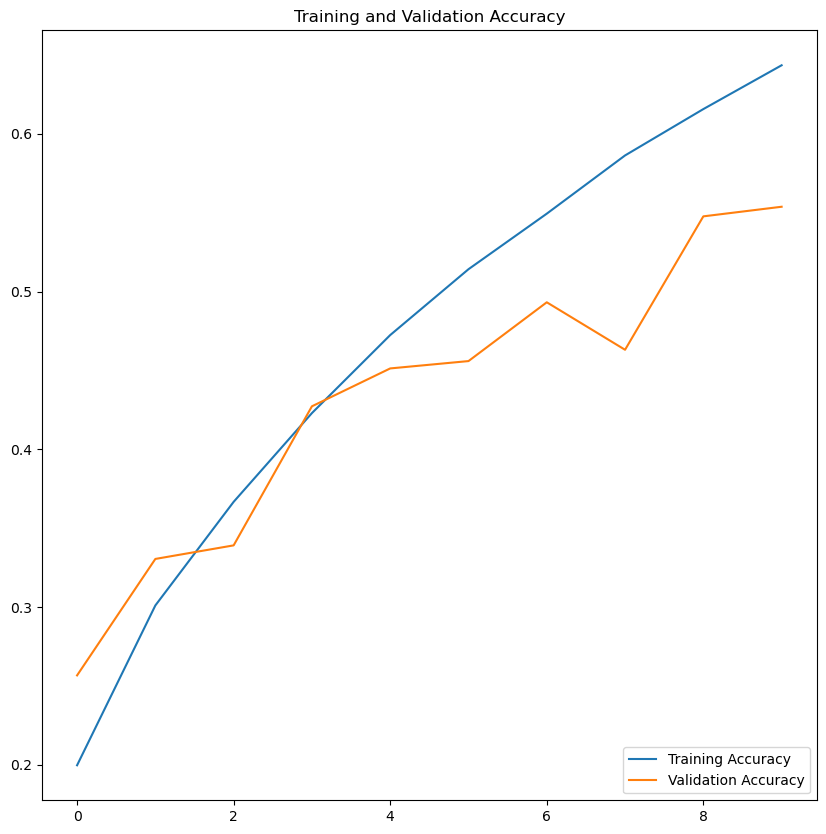

In [147]:
#visualize model performance

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#loss = history.history['loss']
#val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(10, 10))
#plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#plt.subplot(1, 2, 2)
#plt.plot(epochs_range, loss, label='Training Loss')
#plt.plot(epochs_range, val_loss, label='Validation Loss')
#plt.legend(loc='upper right')
#plt.title('Training and Validation Loss')
#plt.show()

In [ ]:
s